In [1]:
import pandas as pd
import numpy as np

from dateutil.parser import parse
from datetime import datetime

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns


import glob
import os
import zipfile




In [2]:
extension = 'txt'
all_filenames = [i for i in glob.glob('*.{}'.format(extension))]

In [4]:
combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])
#export to csv
combined_csv.to_csv( "combined_csv.txt", index=False, encoding='utf-8-sig')

In [2]:
df = pd.read_csv("turnstile_170304.txt")

In [105]:
df.head(100)

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS,key
0,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/25/2017,03:00:00,REGULAR,6064627,2055986,"(A002, R051, 02-00-00, 59 ST)"
1,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/25/2017,07:00:00,REGULAR,6064645,2055999,"(A002, R051, 02-00-00, 59 ST)"
2,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/25/2017,11:00:00,REGULAR,6064712,2056102,"(A002, R051, 02-00-00, 59 ST)"
3,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/25/2017,15:00:00,REGULAR,6064903,2056172,"(A002, R051, 02-00-00, 59 ST)"
4,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/25/2017,19:00:00,REGULAR,6065267,2056245,"(A002, R051, 02-00-00, 59 ST)"
5,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/25/2017,23:00:00,REGULAR,6065408,2056279,"(A002, R051, 02-00-00, 59 ST)"
6,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/26/2017,03:00:00,REGULAR,6065459,2056293,"(A002, R051, 02-00-00, 59 ST)"
7,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/26/2017,07:00:00,REGULAR,6065463,2056301,"(A002, R051, 02-00-00, 59 ST)"
8,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/26/2017,11:00:00,REGULAR,6065522,2056366,"(A002, R051, 02-00-00, 59 ST)"
9,A002,R051,02-00-00,59 ST,NQR456W,BMT,02/26/2017,15:00:00,REGULAR,6065692,2056430,"(A002, R051, 02-00-00, 59 ST)"


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197204 entries, 0 to 197203
Data columns (total 11 columns):
C/A                                                                     197204 non-null object
UNIT                                                                    197204 non-null object
SCP                                                                     197204 non-null object
STATION                                                                 197204 non-null object
LINENAME                                                                197204 non-null object
DIVISION                                                                197204 non-null object
DATE                                                                    197204 non-null object
TIME                                                                    197204 non-null object
DESC                                                                    197204 non-null object
ENTRIES                           

In [32]:
df.describe()

,ENTRIES,EXITS
count,1.972040e+05,1.972040e+05
mean,3.616087e+07,2.892546e+07
std,1.966068e+08,1.778627e+08
min,0.000000e+00,0.000000e+00
25%,5.070722e+05,2.438352e+05
50%,2.629987e+06,1.479292e+06
75%,6.721320e+06,4.743500e+06
max,2.130616e+09,2.087387e+09


In [33]:
df.columns

Index(['C/A', 'UNIT', 'SCP', 'STATION', 'LINENAME', 'DIVISION', 'DATE', 'TIME',
       'DESC', 'ENTRIES',
       'EXITS                                                               '],
      dtype='object')

In [34]:
# take out all whitespace in column names 
df.columns = df.columns.str.replace(' ', '')


## 1. Make a python dict where there is a key for each (C/A, UNIT, SCP, STATION). These are the first four columns. The value for this key should be a list of lists. Each list in the list is the rest of the columns in a row. 

IE: { ('A002','R051','02-00-00','LEXINGTON AVE'): [ ['NQR456', 'BMT', '01/03/2015', '03:00:00', 'REGULAR', '0004945474', '0001675324'], ['NQR456', 'BMT', '01/03/2015', '07:00:00', 'REGULAR', '0004945478', '0001675333'], ['NQR456', 'BMT', '01/03/2015', '11:00:00', 'REGULAR', '0004945515', '0001675364'], ... ] }

In [111]:
df_dict = {}
for index, row in df.iterrows():
    key = tuple(row[df.columns[0:4]].values)
    val = list(row[df.columns[4:]].values)
    df_dict[key] = df_dict.get(key,[]) + [val]

In [52]:
print(df_dict)

{('A002',
  'R051',
  '02-00-00',
  '59 ST'): [['NQR456W',
   'BMT',
   '02/25/2017',
   '03:00:00',
   'REGULAR',
   6064627,
   2055986,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456W',
   'BMT',
   '02/25/2017',
   '07:00:00',
   'REGULAR',
   6064645,
   2055999,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456W',
   'BMT',
   '02/25/2017',
   '11:00:00',
   'REGULAR',
   6064712,
   2056102,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456W',
   'BMT',
   '02/25/2017',
   '15:00:00',
   'REGULAR',
   6064903,
   2056172,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456W',
   'BMT',
   '02/25/2017',
   '19:00:00',
   'REGULAR',
   6065267,
   2056245,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456W',
   'BMT',
   '02/25/2017',
   '23:00:00',
   'REGULAR',
   6065408,
   2056279,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456W',
   'BMT',
   '02/26/2017',
   '03:00:00',
   'REGULAR',
   6065459,
   2056293,
   ('A002', 'R051', '02-00-00', '59 ST')], ['NQR456

## 2. For each key (basically the control area, unit, device address and station of a specific turnstile), have a list again, but let the list be comprised of just the point in time and the count of entries.

This basically means keeping only the date, time, and entries fields in each list. You can convert the date and time into datetime objects -- That is a python class that represents a point in time. You can combine the date and time fields into a string and use the dateutil module to convert it into a datetime object. 

Your new dict should look something like

{ ('A002','R051','02-00-00','LEXINGTON AVE'): [ [datetime.datetime(2013, 3, 2, 3, 0), 3788], [datetime.datetime(2013, 3, 2, 7, 0), 2585], [datetime.datetime(2013, 3, 2, 12, 0), 10653], [datetime.datetime(2013, 3, 2, 17, 0), 11016], [datetime.datetime(2013, 3, 2, 23, 0), 10666], [datetime.datetime(2013, 3, 3, 3, 0), 10814], [datetime.datetime(2013, 3, 3, 7, 0), 10229], ... ], .... }

In [112]:
import dateutil.parser


my_dict_2 = {}
for index, row in df.iterrows():
    key = tuple(row[df.columns[0:4]].values)
    datetime_str = row['DATE'] + ' ' + row['TIME']
    datetime_parsed = dateutil.parser.parse(datetime_str) 
    val = [datetime_parsed, row['ENTRIES']]
    my_dict_2[key] = my_dict_2.get(key,[]) + [val]

In [113]:
my_dict_2

{('A002',
  'R051',
  '02-00-00',
  '59 ST'): [[datetime.datetime(2017, 2, 25, 3, 0),
   6064627], [datetime.datetime(2017, 2, 25, 7, 0), 6064645], [datetime.datetime(2017, 2, 25, 11, 0),
   6064712], [datetime.datetime(2017, 2, 25, 15, 0),
   6064903], [datetime.datetime(2017, 2, 25, 19, 0), 6065267], [datetime.datetime(2017, 2, 25, 23, 0),
   6065408], [datetime.datetime(2017, 2, 26, 3, 0),
   6065459], [datetime.datetime(2017, 2, 26, 7, 0), 6065463], [datetime.datetime(2017, 2, 26, 11, 0),
   6065522], [datetime.datetime(2017, 2, 26, 15, 0),
   6065692], [datetime.datetime(2017, 2, 26, 19, 0), 6065926], [datetime.datetime(2017, 2, 26, 23, 0),
   6066064], [datetime.datetime(2017, 2, 27, 3, 0),
   6066090], [datetime.datetime(2017, 2, 27, 7, 0), 6066103], [datetime.datetime(2017, 2, 27, 11, 0),
   6066270], [datetime.datetime(2017, 2, 27, 15, 0),
   6066477], [datetime.datetime(2017, 2, 27, 19, 0), 6067332], [datetime.datetime(2017, 2, 27, 23, 0),
   6067627], [datetime.datetime(2017

## 3: Create new dictionary with the same keys, but a single entry count per turnstile for each day.

Now make it that we again have the same keys, but now we have a single value for a single day, which is the total number of passengers that entered through this turnstile on this day.

In [145]:
# group the dataframe by turnstile identifying and date columns and aggregate the entry column by taking minumums. 
# Since the entry column tracks cumulative entries, for any given day the total entries should be given by the difference 
# between the min of next day's entry values and the min of this day's entry values.

df_byDate = df.groupby(['C/A','UNIT','SCP','STATION','DATE']).ENTRIES.agg({'MIN_ENTRIES':'min'})
df_byDate = df_byDate.reset_index()

df_byDate['DAILY_ENTRIES'] = df_byDate.groupby(['C/A','UNIT','SCP','STATION']).MIN_ENTRIES.diff().shift(-1)

In [114]:
# set the negative entry values or excessively large entry values to NaN 
#(invalid, something went wrong with the cumulative count).

# df_byDate.drop('MIN_ENTRIES',axis=1,inplace=True)  <- already ran this and got error when tried to re-run
df_byDate.loc[df_byDate['DAILY_ENTRIES'] <= 0, 'DAILY_ENTRIES'] = np.nan
df_byDate.loc[df_byDate['DAILY_ENTRIES'] > 100000, 'DAILY_ENTRIES'] = np.nan
df_byDate.head(50)

,C/A,UNIT,SCP,STATION,DATE,DAILY_ENTRIES
0,A002,R051,02-00-00,59 ST,02/25/2017,832.0
1,A002,R051,02-00-00,59 ST,02/26/2017,631.0
2,A002,R051,02-00-00,59 ST,02/27/2017,1576.0
3,A002,R051,02-00-00,59 ST,02/28/2017,1432.0
4,A002,R051,02-00-00,59 ST,03/01/2017,1541.0
5,A002,R051,02-00-00,59 ST,03/02/2017,1478.0
6,A002,R051,02-00-00,59 ST,03/03/2017,NaN
7,A002,R051,02-00-01,59 ST,02/25/2017,654.0
8,A002,R051,02-00-01,59 ST,02/26/2017,519.0
9,A002,R051,02-00-01,59 ST,02/27/2017,1166.0


In [91]:
# create the dictionary to answer question above

my_dict_3 = {}
for index, row in df_byDate.iterrows():
    key = tuple(row[df_byDate.columns[0:4]].values)
    datetime_str = row['DATE']
    datetime_parsed = dateutil.parser.parse(datetime_str) 
    val = [datetime_parsed,row['DAILY_ENTRIES']]
    my_dict_3[key] = my_dict_3.get(key,[]) + [val]

In [72]:
my_dict_3

{('A002',
  'R051',
  '02-00-00',
  '59 ST'): [[datetime.datetime(2017, 2, 25, 0, 0),
   832.0], [datetime.datetime(2017, 2, 26, 0, 0), 631.0], [datetime.datetime(2017, 2, 27, 0, 0),
   1576.0], [datetime.datetime(2017, 2, 28, 0, 0),
   1432.0], [datetime.datetime(2017, 3, 1, 0, 0), 1541.0], [datetime.datetime(2017, 3, 2, 0, 0),
   1478.0], [datetime.datetime(2017, 3, 3, 0, 0), nan]],
 ('A002',
  'R051',
  '02-00-01',
  '59 ST'): [[datetime.datetime(2017, 2, 25, 0, 0),
   654.0], [datetime.datetime(2017, 2, 26, 0, 0), 519.0], [datetime.datetime(2017, 2, 27, 0, 0),
   1166.0], [datetime.datetime(2017, 2, 28, 0, 0),
   1170.0], [datetime.datetime(2017, 3, 1, 0, 0), 1245.0], [datetime.datetime(2017, 3, 2, 0, 0),
   1275.0], [datetime.datetime(2017, 3, 3, 0, 0), nan]],
 ('A002',
  'R051',
  '02-03-00',
  '59 ST'): [[datetime.datetime(2017, 2, 25, 0, 0),
   371.0], [datetime.datetime(2017, 2, 26, 0, 0), 254.0], [datetime.datetime(2017, 2, 27, 0, 0),
   574.0], [datetime.datetime(2017, 2, 28

## 4 Plot the daily time series for a turnstile.

Take the list of [(date1, count1), (date2, count2), ...], for the turnstile and turn it into two lists: dates and counts. This should plot it:

plt.figure(figsize=(10,3))
plt.plot(dates,counts)



In [92]:
turnstile_lists = my_dict_3[('A002','R051','02-00-00','59 ST')]
dates, counts = [], []
for turnstile_list in turnstile_lists:
    dates += [turnstile_list[0]]
    counts += [turnstile_list[1]]

Text(0, 0.5, 'Total Entries')

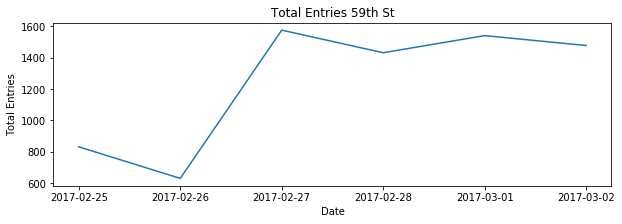

In [93]:
plt.figure(figsize=(10,3))
plt.plot(dates,counts)
plt.title('Total Entries 59th St')
plt.xlabel('Date')
plt.ylabel('Total Entries')

## 5 So far we've been operating on a single turnstile level, let's combine turnstiles in the same ControlArea/Unit/Station combo. There are some ControlArea/Unit/Station groups that have a single turnstile, but most have multiple turnstilea-- same value for the C/A, UNIT and STATION columns, different values for the SCP column.

We want to combine the numbers together -- for each ControlArea/UNIT/STATION combo, for each day, add the counts from each turnstile belonging to that combo.

In [149]:
df_TurnCombo = df_byDate.reset_index().drop('SCP',axis=1)
df_TurnCombo = df_byDate.groupby(['C/A','UNIT','STATION','DATE'])['DAILY_ENTRIES'].sum()
df_TurnCombo.head()

C/A   UNIT  STATION  DATE      
A002  R051  59 ST    02/25/2017     8319.0
                     02/26/2017     6371.0
                     02/27/2017    13991.0
                     02/28/2017    14188.0
                     03/01/2017    14562.0
Name: DAILY_ENTRIES, dtype: float64

In [141]:
print(df_TurnCombo)

<bound method GroupBy.sum of <pandas.core.groupby.generic.SeriesGroupBy object at 0x1ad8c14160>>


## 6 Similarly, combine everything in each station, and come up with a time series of [(date1, count1),(date2,count2),...] type of time series for each STATION, by adding up all the turnstiles in a station.

In [150]:
df_StatCombo = df_TurnCombo.reset_index().drop(['C/A','UNIT'],axis=1)
df_StatCombo = df_StatCombo.groupby(['STATION','DATE'])['DAILY_ENTRIES'].sum()

df_StatCombo.head(7)

STATION  DATE      
1 AV     02/25/2017    17508.0
         02/26/2017    13025.0
         02/27/2017    21650.0
         02/28/2017    22466.0
         03/01/2017    22943.0
         03/02/2017    23665.0
         03/03/2017        0.0
Name: DAILY_ENTRIES, dtype: float64

## 7 Plot the time series for a station.

In [96]:
df_StatCombo = df_StatCombo.reset_index()
df_Stat59 = df_StatCombo[df_StatCombo['STATION'] == '59 ST']

dates = [dateutil.parser.parse(date) for date in df_Stat59['DATE'].values]
counts = df_Stat59['DAILY_ENTRIES'].values

Text(0, 0.5, 'Total Entries')

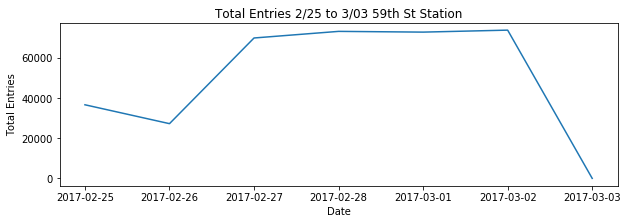

In [97]:
plt.figure(figsize=(10,3))
plt.plot(dates,counts)
plt.title('Total Entries 2/25 to 3/03 59th St Station')
plt.xlabel('Date')
plt.ylabel('Total Entries')

## 8 Make one list of counts for one week for one station. Monday's count, Tuesday's count, etc. so it's a list of 7 counts. Make the same list for another week, and another week, and another week. plt.plot(week_count_list) for every week_count_list you created this way. You should get a rainbow plot of weekly commute numbers on top of each other.

ValueError: x and y must have same first dimension, but have shapes (7,) and (0,)

<Figure size 720x216 with 0 Axes>

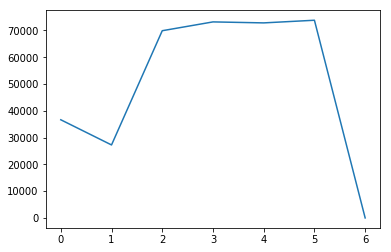

In [135]:
days_list = ['Saturday','Sunday','Monday','Tuesday','Wednesday','Thursday','Friday']

plt.figure(figsize=(10,3))
fig, ax = plt.subplots()

labels = []
for i in range(0,5):
    plt.plot(list(range(7)),counts[i*7:(i+1)*7])
    labels.append('Week of ' + str(dates[i*7].date()))

plt.title('Total Entries By Day Of The Week For 59th St Station')
plt.xticks(range(7),days_list)
plt.xlabel('Day Of The Week')
plt.ylabel('Total Entries')

ax.legend(labels, loc='best')
plt.show()

## 9 Over multiple weeks, sum total ridership for each station and sort them, so you can find out the stations with the highest traffic during the time you investigate.

In [102]:
df_StatTotal = df_StatCombo.groupby('STATION')['DAILY_ENTRIES'].sum()
df_StatTotal.sort_values(ascending=False,inplace=True)
df_StatTotal.head(10)

STATION
34 ST-PENN STA     857038.0
GRD CNTRL-42 ST    725019.0
23 ST              596972.0
34 ST-HERALD SQ    567369.0
14 ST-UNION SQ     566798.0
TIMES SQ-42 ST     498998.0
42 ST-PORT AUTH    474634.0
86 ST              457520.0
FULTON ST          454452.0
125 ST             391574.0
Name: DAILY_ENTRIES, dtype: float64

## Make a single list of these total ridership values and plot it with

plt.hist(total_ridership_counts)

to get an idea about the distribution of total ridership among different stations.

This should show you that most stations have a small traffic, and the histogram bins for large traffic volumes have small bars

Text(0, 0.5, 'Count Of Stations')

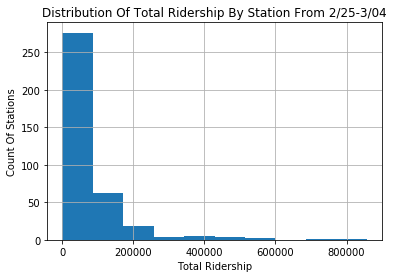

In [104]:
df_StatTotal.hist()

plt.title('Distribution Of Total Ridership By Station From 2/25-3/04')
plt.xlabel('Total Ridership')
plt.ylabel('Count Of Stations')
